In [2]:
import matplotlib.pyplot as plt
from skimage import color
import numpy as np
import imageio
%matplotlib inline
plt.rcParams.update({'font.size': 10})

## (a) Problem set up:

#### (a-i) Display Original Image:

The dimention of image:  (1024, 1024, 3)
The intensity range of Red channel is [0, 255]
The intensity range of Green channel is [0, 255]
The intensity range of Blue channel is [0, 255]


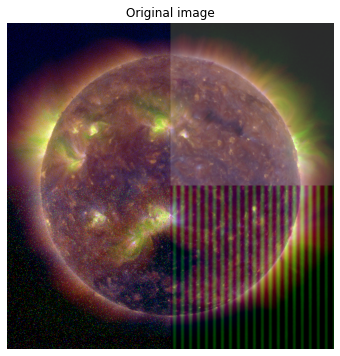

In [3]:
I = np.asarray(imageio.imread('EE446_596_PE2_image.tiff'))
plt.figure(figsize=(8,6))
plt.imshow(I)
plt.axis('off')
plt.title('Original image')
print('The dimention of image: ', np.shape(I))
R = I[:,:,0]
G = I[:,:,1]
B = I[:,:,2]
print('The intensity range of Red channel is [%s, %s]' % (np.min(R), np.max(R)))
print('The intensity range of Green channel is [%s, %s]' % (np.min(G), np.max(G)))
print('The intensity range of Blue channel is [%s, %s]' % (np.min(B), np.max(B)))

#### (a-ii) Extracting Quadrants:

Text(0.5, 1.0, 'The lower right quadrant of the original image')

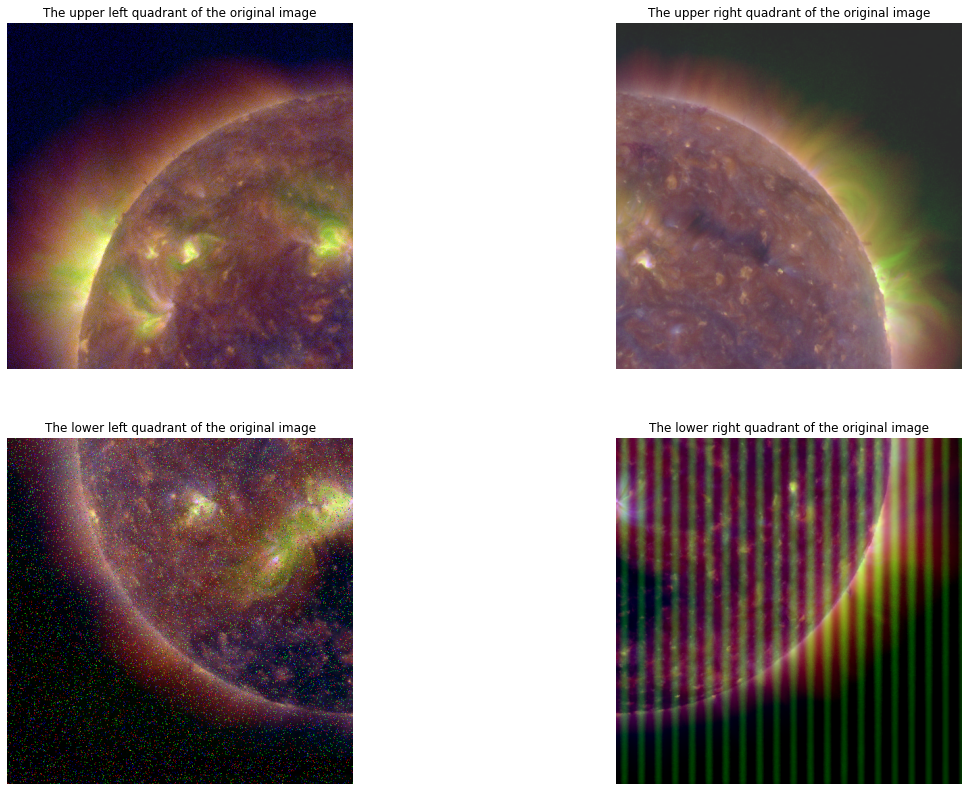

In [4]:
c = int((I.shape[0]/2))
plt.figure(figsize=(20,14))
plt.subplot(2,2,1)
I_UL = I[0:c, 0:c]
plt.imshow(I_UL)
plt.axis('off')
plt.title('The upper left quadrant of the original image')
plt.subplot(2,2,2)
I_UR = I[0:c, c:I.shape[1]]
plt.imshow(I_UR)
plt.axis('off')
plt.title('The upper right quadrant of the original image')
plt.subplot(2,2,3)
I_LL = I[c:I.shape[0], 0:c]
plt.imshow(I_LL)
plt.axis('off')
plt.title('The lower left quadrant of the original image')
plt.subplot(2,2,4)
I_LR = I[c:I.shape[0], c:I.shape[1]]
plt.imshow(I_LR)
plt.axis('off')
plt.title('The lower right quadrant of the original image')

#### (a-iii) Qualitative Discussion of Quadrant Appearance:

All quadrants seem to be degraded. The appearance of the upper left quadrant seems it does not have any degradation, but the other characteristic of this image, such as its histogram should be checked for better analysis. By comparing the appearance of this quadrant with clean image, it seems that the image is degraded because a random variation in brightness and colour information. The upper right quadrant has also some degradation, it seems that its intensities are brighter than other quadrants. The reason for this difference can be scaling the intensity range or noise, such as Gaussian noise. The lower left quadrant is a noisy image which is degraded with salt and pepper noise. Based on the color of this salt and pepper noise, it seems that this kind of noise has been applied in all three channels. The lower right image is also noisy and is corrupted with periodic noise. Based on its color, it seems that this kind of noise is applied to the green channel.

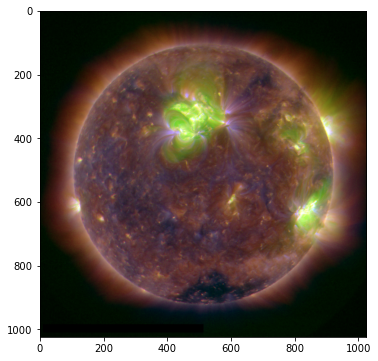

In [5]:
I_clean = np.asarray(imageio.imread('EE446_596_PE2_examplecleanimage.tiff'))
plt.figure(figsize=(8,6))
plt.imshow(I_clean)
cc = int((I_clean.shape[0]/2))
Ic_UL = I_clean[0:cc, 0:cc]
Ic_UR = I_clean[0:cc, cc:I_clean.shape[1]]
Ic_LL = I_clean[cc:I_clean.shape[0], 0:cc]
Ic_LR = I_clean[cc:I_clean.shape[0], cc:I_clean.shape[1]]

## (b) Upper left quadrant:

#### (b-i) R, G, B Channels:

Text(0.5, 1.0, 'The histogram of the Blue channel of upper left quadrant')

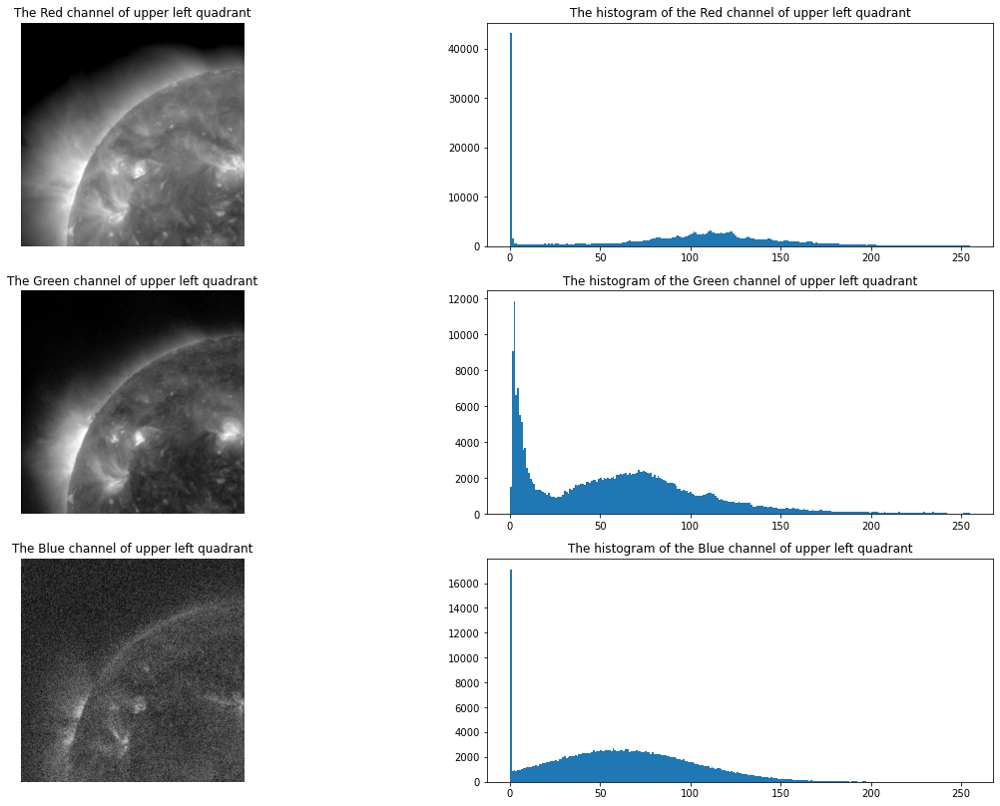

In [6]:
I_UL_R = I_UL[:,:,0]
I_UL_G = I_UL[:,:,1]
I_UL_B = I_UL[:,:,2]
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
plt.imshow(I_UL_R, cmap='gray')
plt.axis('off')
plt.title('The Red channel of upper left quadrant')
plt.subplot(3,2,2)
plt.hist(I_UL_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper left quadrant')
plt.subplot(3,2,3)
plt.imshow(I_UL_G, cmap='gray')
plt.axis('off')
plt.title('The Green channel of upper left quadrant')
plt.subplot(3,2,4)
plt.hist(I_UL_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper left quadrant')
plt.subplot(3,2,5)
plt.imshow(I_UL_B, cmap='gray')
plt.axis('off')
plt.title('The Blue channel of upper left quadrant')
plt.subplot(3,2,6)
plt.hist(I_UL_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper left quadrant')

Based on the visualization of three channels of the upper left quadrant image, the blue channel is vividly noisy. The histogram of other channels should be compared to three channels of the clean image for better determination of noisy channels and its type.

#### (b-ii) Determine Degradation(s) and Relevant Parameters:

Text(0.5, 1.0, 'The histogram of the Blue channel of upper left quadrant of original image')

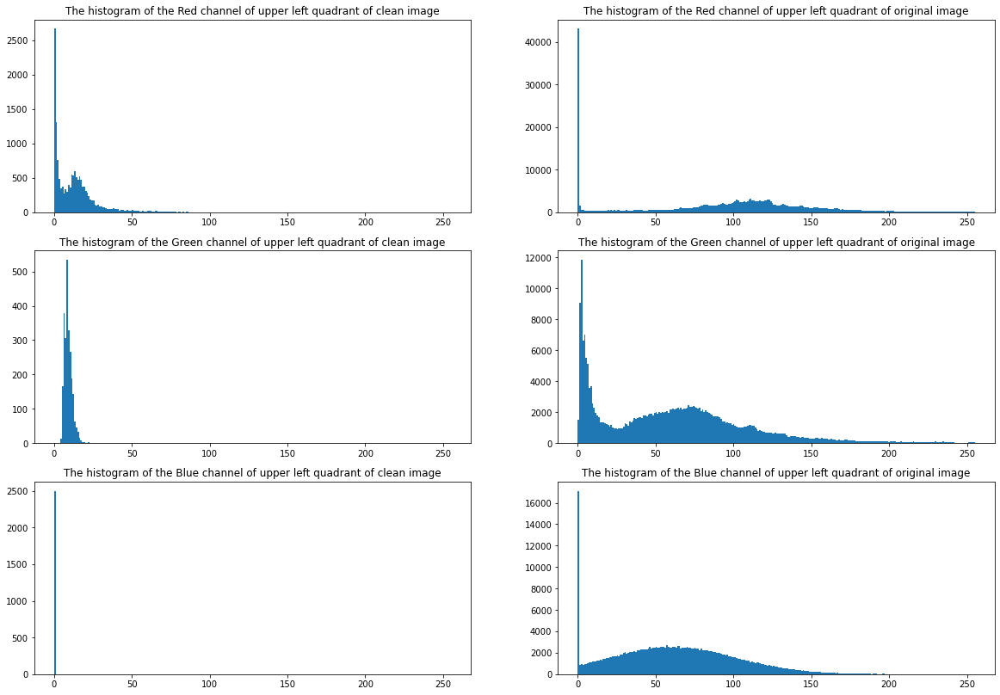

In [15]:
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
plt.hist(Ic_UL_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper left quadrant of clean image')
plt.subplot(3,2,2)
plt.hist(I_UL_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper left quadrant of original image')
plt.subplot(3,2,3)
plt.hist(Ic_UL_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper left quadrant of clean image')
plt.subplot(3,2,4)
plt.hist(I_UL_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper left quadrant of original image')
plt.subplot(3,2,5)
plt.hist(Ic_UL_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper left quadrant of clean image')
plt.subplot(3,2,6)
plt.hist(I_UL_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper left quadrant of original image')

Text(0.5, 1.0, 'The histogram of the Blue channel of upper left quadrant of original image')

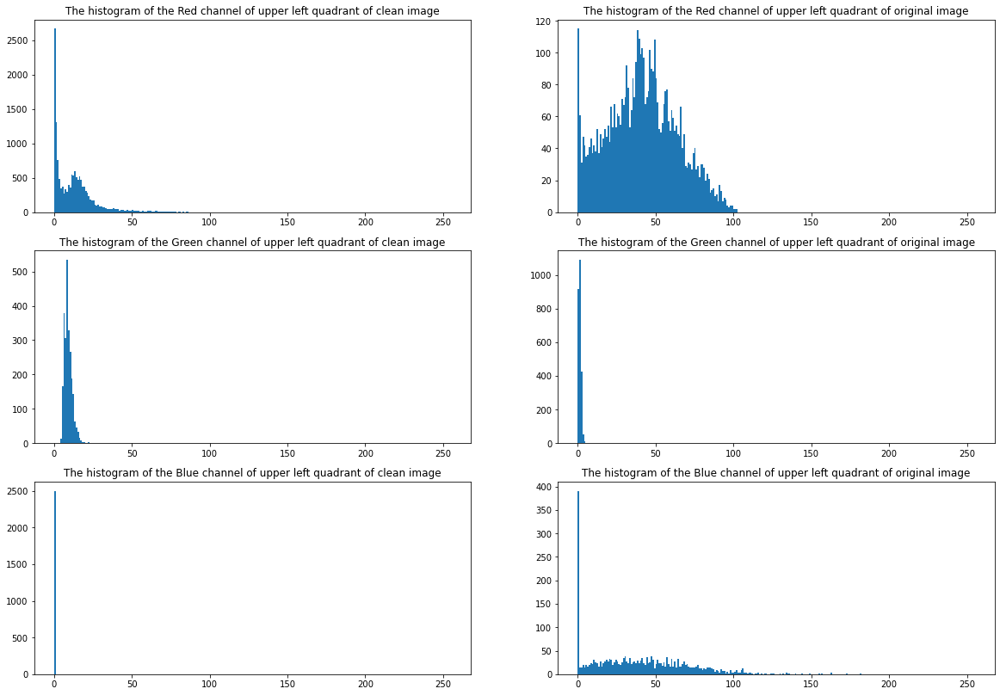

In [7]:
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
Ic_UL_R=Ic_UL[100:150,150:250]
plt.hist(Ic_UL_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper left quadrant of clean image')
plt.subplot(3,2,2)
plt.hist(I_UL_R[100:150,150:250].flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper left quadrant of original image')
plt.subplot(3,2,3)
Ic_UL_G=Ic_UL[0:50,0:50,1]
plt.hist(Ic_UL_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper left quadrant of clean image')
plt.subplot(3,2,4)
plt.hist(I_UL_G[0:50,0:50].flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper left quadrant of original image')
plt.subplot(3,2,5)
Ic_UL_B=Ic_UL[0:50,0:50,2]
plt.hist(Ic_UL_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper left quadrant of clean image')
plt.subplot(3,2,6)
plt.hist(I_UL_B[0:50,0:50].flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper left quadrant of original image')

Here, the small part of image which reasonably has constant background intensity is selected in each channel to better determine the degradation of image and its relevant parameters. Based on the visualization of the histogram plots of the clean image and the original image, three channels of image have been degraded with Gaussian noise. The Red, Green and Blue channels are noisy and the type of noise is Gaussian for Red and Blue and Rayleigh for the Green channel. The type of noise is determined based on the similarity of the histogram shape to the PDF of noises. For computing the noise parameter, the mean and standard deviation of the region is calculated. For Gaussian noise, these parameters have defined the noise. For Rayleigh noise, a and b are calculated based on the relation between mean and standard deviation and a and b.

In [8]:
m_g = np.mean(I_UL_R[100:150,150:250])
var_g = np.var(I_UL_R[100:150,150:250])
print('The mean of Gaussian noise:', m_g)
print('The standard deviation of Gaussian noise:', var_g**(0.5))

The mean of Gaussian noise: 41.1102
The standard deviation of Gaussian noise: 22.498090051379915


In [9]:
m_r = np.mean(I_UL_G[0:50,0:50])
var_r = np.var(I_UL_G[0:50,0:50])
print('The mean of Rayleigh noise:', m_r)
print('The variance of Rayleigh noise:', var_r)

The mean of Rayleigh noise: 0.8636
The variance of Rayleigh noise: 0.67139504


In [10]:
a = -0.7
b = 3.12
print('The parmeters of Rayleigh noise are a=%s and b=%s.'%(a,b))

The parmeters of Rayleigh noise are a=-0.7 and b=3.12.


In [11]:
m_g2 = np.mean(I_UL_B[0:50,0:50])
var_g2 = np.var(I_UL_B[0:50,0:50])
print('The mean of Gaussian noise:', m_g2)
print('The standard deviation of Gaussian noise:', var_g2**(0.5))

The mean of Gaussian noise: 39.004
The standard deviation of Gaussian noise: 31.05310264691759


#### (b-iii) Restoration of Degraded Channels:

In [12]:
def median_filter(f,nsize):
    M = f.shape[0]
    N = f.shape[1]
    
    fhat = np.zeros([M,N])
    xp = int((nsize-1)/2)
    fp = np.zeros([M+(xp*2),N+(xp*2)])
    
    fp[xp:M+xp, xp:N+xp] = f
    
    for i in range(M):
        for j in range(N):
            s = fp[i:i+nsize, j:j+nsize]
            sn = s.reshape(-1)
            fhat[i,j] = np.median(sn)
       
    return fhat

I_UL_R_restored=median_filter(I_UL_R,3)
I_UL_G_restored=median_filter(I_UL_G,3)

In [13]:
def alpha_trimmed_mean_filter(f,nsize,d):
    M = f.shape[0]
    N = f.shape[1]
    
    fhat = np.zeros([M,N])
    xp = int((nsize-1)/2)
    fp = np.zeros([M+(xp*2),N+(xp*2)])
    
    fp[xp:M+xp, xp:N+xp] = f
    d2 = int(d/2)
    for i in range(M):
        for j in range(N):
            s = fp[i:i+nsize, j:j+nsize]
            sr = np.sort(s.flatten())
            sn = sr[d2:-d2]
            fhat[i,j] = (1/((nsize**2)-d))*np.sum(sn)
       
    return fhat

I_UL_B_restored=alpha_trimmed_mean_filter(I_UL_B,7,24)

Text(0.5, 1.0, 'The restored Blue channel of upper right quadrant')

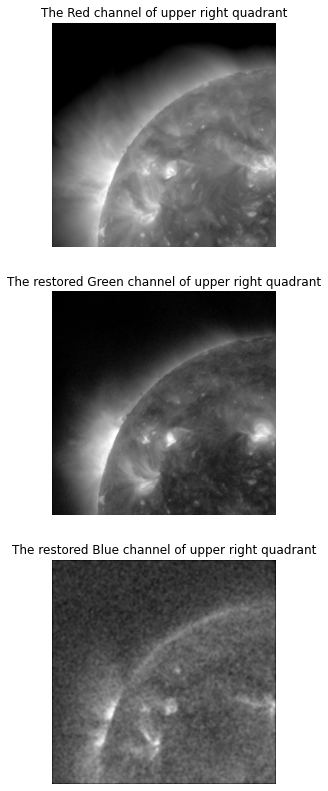

In [14]:
plt.figure(figsize=(20,14))
plt.subplot(3,1,1)
I_UL_R_restored[I_UL_R_restored<0]=0
I_UL_R_restored[I_UL_R_restored>255]=255
plt.imshow(I_UL_R_restored, cmap='gray')
plt.axis('off')
plt.title('The Red channel of upper right quadrant')
plt.subplot(3,1,2)
I_UL_G_restored[I_UL_G_restored<0]=0
I_UL_G_restored[I_UL_G_restored>255]=255
plt.imshow(I_UL_G_restored, cmap='gray')
plt.axis('off')
plt.title('The restored Green channel of upper right quadrant')
plt.subplot(3,1,3)
I_UL_B_restored[I_UL_B_restored<0]=0
I_UL_B_restored[I_UL_B_restored>255]=255
plt.imshow(I_UL_B_restored, cmap='gray')
plt.axis('off')
plt.title('The restored Blue channel of upper right quadrant')

Here, as it is mentioned, all three channels are needed to be restored due to being noisy. For Red and Green channels, a 3x3 median filter is applied for restoration. For the Blue channel, the noise is gaussian and has a high mean and variance. For restoration, Alpha-Trimmed Mean Filter with size of 7x7 and d=24 is applied. This filter has a good performance in gaussian noise and multiple types of noise. 

#### (b-iv) Recompose the Restored Quadrant:

Text(0.5, 1.0, 'The upper left quadrant of original image')

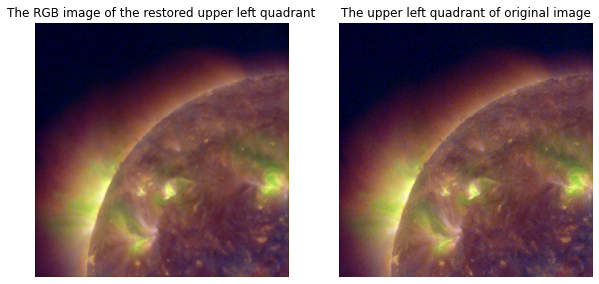

In [16]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
I_UL_restored = np.dstack((I_UL_R_restored,I_UL_G_restored,I_UL_B_restored))
I_UL_restored = I_UL_restored/255
plt.imshow(I_UL_restored)
plt.axis('off')
plt.title('The RGB image of the restored upper left quadrant')
plt.subplot(1,2,2)
plt.imshow(I_UL)
plt.axis('off')
plt.title('The upper left quadrant of original image')

By plotting the three channels of the original image and their histogram, it is shown that the three channels of this image are noisy. It is tried to restore each channel of this image. In the end, by illustrating the restored image and original image next to each other, it seems their appearance is the same. 

#### (b-v) Comparison to Reference Image:

MSE of Red channel is: 1843.8111152648926
MSE of Green channel is: 2170.747142791748
MSE of Blue channel is: 1187.5819075866702
MSE of RGB image is: 5934.0312208432615


Text(0.5, 1.0, 'The difference of I_UL and Ic_UL in Blue channel')

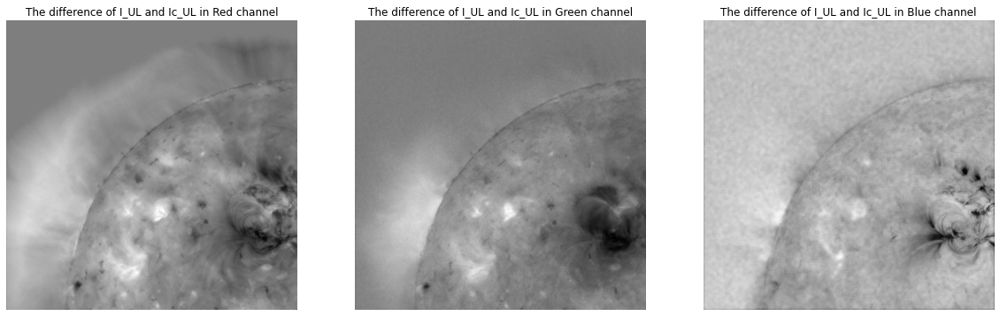

In [17]:
difference_R = np.subtract(I_UL_R_restored, Ic_UL[:,:,0])
difference_G = np.subtract(I_UL_G_restored, Ic_UL[:,:,1])
difference_B = np.subtract(I_UL_B_restored, Ic_UL[:,:,2])
squared_R = np.square(difference_R)
MSE_R = squared_R.mean()
squared_G = np.square(difference_G)
MSE_G = squared_G.mean()
squared_B = np.square(difference_B)
MSE_B = squared_B.mean()
print("MSE of Red channel is:", MSE_R)
print("MSE of Green channel is:", MSE_G)
print("MSE of Blue channel is:", MSE_B)
difference = np.subtract(I_UL_restored, Ic_UL)
squared = np.square(difference)
MSE = squared.mean()
print("MSE of RGB image is:", MSE)
plt.figure(figsize=(20,14))
plt.subplot(1,3,1)
plt.imshow(difference_R, cmap='gray')
plt.title("The difference of I_UL and Ic_UL in Red channel")
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(difference_G, cmap='gray')
plt.title("The difference of I_UL and Ic_UL in Green channel")
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(difference_B, cmap='gray')
plt.axis('off')
plt.title("The difference of I_UL and Ic_UL in Blue channel")

Text(0.5, 1.0, 'The upper left quadrant of clean image')

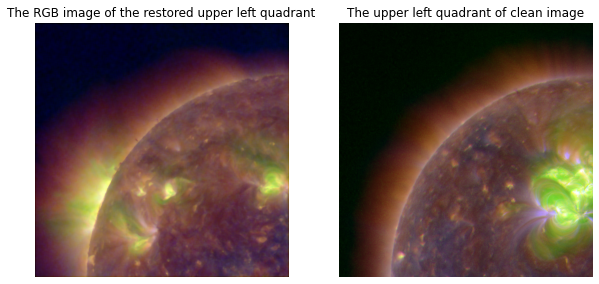

In [18]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
plt.imshow(I_UL_restored)
plt.axis('off')
plt.title('The RGB image of the restored upper left quadrant')
plt.subplot(1,2,2)
plt.imshow(Ic_UL)
plt.axis('off')
plt.title('The upper left quadrant of clean image')

In this part, the restored image is compared with the clean image. Based on the MSE, the difference between these two images is high. Plotting the difference between the three channels of these two images also shows this fact. The RGB image of the restored and clean images illustrates the significant variation in intensity and colors of pixels. For example, consider the green-ish region in the clean image. The location of this region varies in each image. In the restored image, this part is not restored correctly. The noise applied in different channels causes this random variation in brightness and color information in the image and the filters could not restore this change. In addition, the emitted light from the sun has a different color from the clean image. 

## (c) Upper right quadrant:

#### (c-i) R, G, B Channels:

Text(0.5, 1.0, 'The histogram of the Blue channel of upper right quadrant')

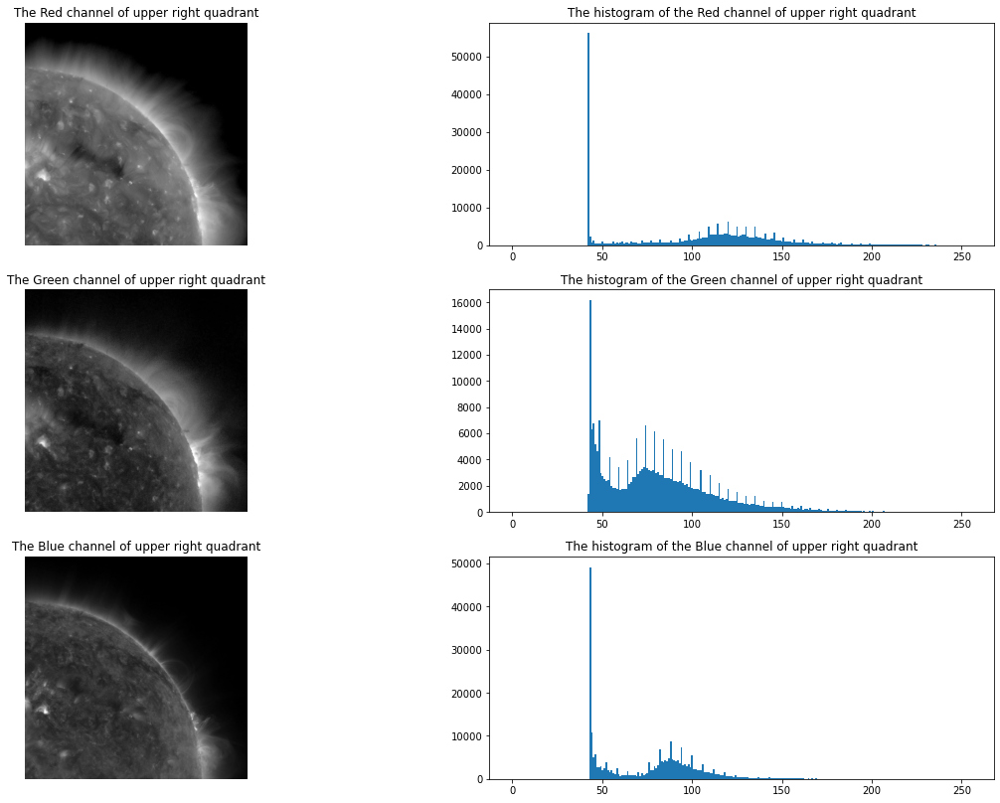

In [19]:
I_UR_R = I_UR[:,:,0]
I_UR_G = I_UR[:,:,1]
I_UR_B = I_UR[:,:,2]
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
plt.imshow(I_UR_R, cmap='gray')
plt.axis('off')
plt.title('The Red channel of upper right quadrant')
plt.subplot(3,2,2)
plt.hist(I_UR_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper right quadrant')
plt.subplot(3,2,3)
plt.imshow(I_UR_G, cmap='gray')
plt.axis('off')
plt.title('The Green channel of upper right quadrant')
plt.subplot(3,2,4)
plt.hist(I_UR_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper right quadrant')
plt.subplot(3,2,5)
plt.imshow(I_UR_B, cmap='gray')
plt.axis('off')
plt.title('The Blue channel of upper right quadrant')
plt.subplot(3,2,6)
plt.hist(I_UR_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper right quadrant')

Based on the visualization, all channels have degradation. The intensity of all of them have scaled and it seem the nosie is applied in each channel. For better determing the type of degradation, these histogram should be compared with the clean image.

#### (c-ii) Determine Degradation(s) and Relevant Parameters:

Text(0.5, 1.0, 'The histogram of the Blue channel of scaled I_original_UL')

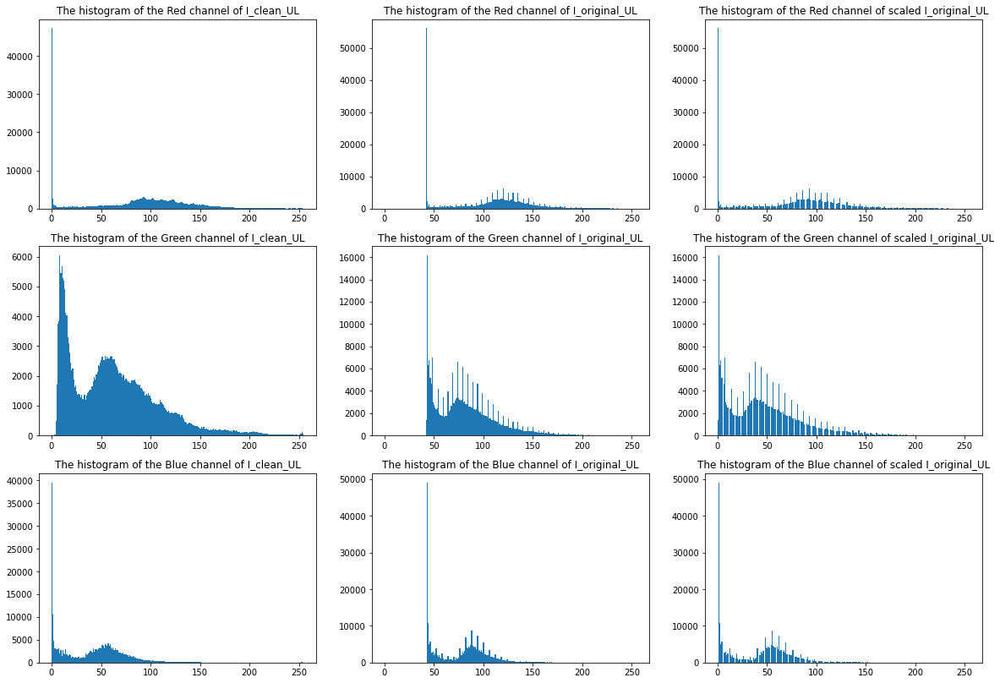

In [20]:
plt.figure(figsize=(20,14))
plt.subplot(3,3,1)
Ic_UR_R=Ic_UR[:,:,0]
plt.hist(Ic_UR_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of I_clean_UL')
plt.subplot(3,3,2)
plt.hist(I_UR_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of I_original_UL')
plt.subplot(3,3,3)
I_UR_R1=((I_UR_R-42)/(255-42))*255
plt.hist(I_UR_R1.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of scaled I_original_UL')
plt.subplot(3,3,4)
Ic_UR_G=Ic_UR[:,:,1]
plt.hist(Ic_UR_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of I_clean_UL')
plt.subplot(3,3,5)
plt.hist(I_UR_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of I_original_UL')
plt.subplot(3,3,6)
I_UR_G1=((I_UR_G-42)/(255-42))*255
plt.hist(I_UR_G1.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of scaled I_original_UL')
plt.subplot(3,3,7)
Ic_UR_B=Ic_UR[:,:,2]
plt.hist(Ic_UR_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of I_clean_UL')
plt.subplot(3,3,8)
plt.hist(I_UR_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of I_original_UL')
plt.subplot(3,3,9)
I_UR_B1=((I_UR_B-42)/(255-42))*255
plt.hist(I_UR_B1.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of scaled I_original_UL')

This visualization compares the histogram of three different channels of the upper right quadrant of the original image, clean image and the scaled original image. It is shown that the intensity of image in each channel is scaled. Thus, all of the channels have degradation in type of reducing intensity resolution. However, it is clear from scaled histogram that all channels have another kind of degradation. All of them are noisy and the type of noise is uniform. 

#### For better illustration, all the histagram plot are zoomed.

Text(0.5, 1.0, 'The histogram of the Blue channel of upper right quadrant')

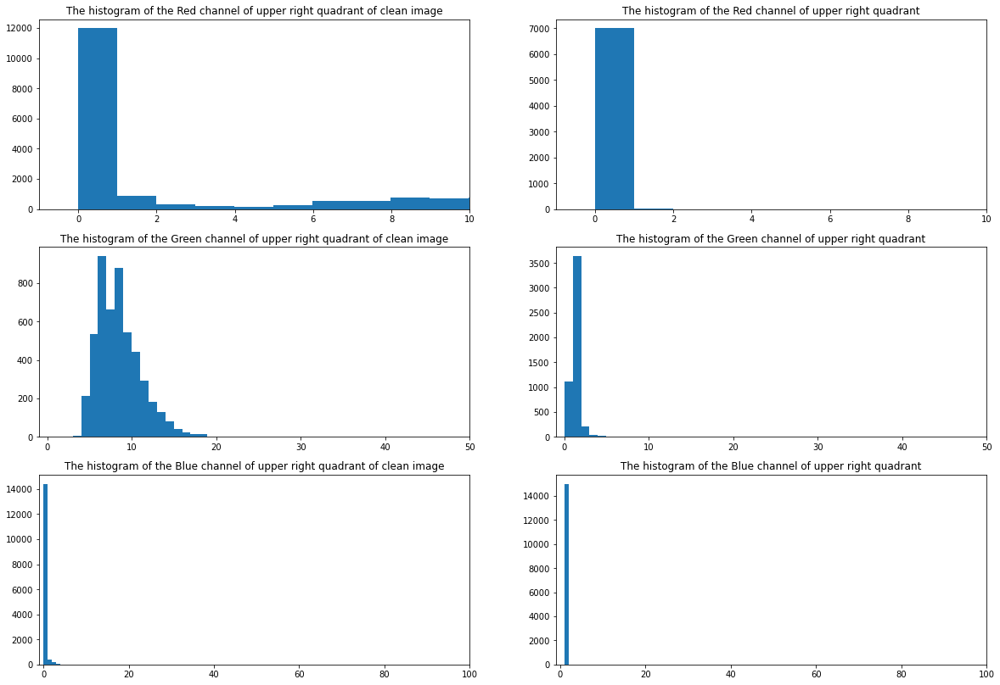

In [21]:
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
Ic_UR_R=Ic_UR[100:170,400:500]
plt.hist(Ic_UR_R.flatten(),bins=256,range=(0,255))
plt.xlim(-1,10)
plt.title('The histogram of the Red channel of upper right quadrant of clean image')
plt.subplot(3,2,2)
h,_,_=plt.hist(I_UR_R1[100:170,400:500].flatten(),bins=256,range=(0,255))
plt.xlim(-1,10)
plt.title('The histogram of the Red channel of upper right quadrant')
plt.subplot(3,2,3)
Ic_UR_G=Ic_UR[0:50,400:500,1]
plt.hist(Ic_UR_G.flatten(),bins=256,range=(0,255))
plt.xlim(-1,50)
plt.title('The histogram of the Green channel of upper right quadrant of clean image')
plt.subplot(3,2,4)
plt.hist(I_UR_G1[0:50,400:500].flatten(),bins=256,range=(0,255))
plt.xlim(-1,50)
plt.title('The histogram of the Green channel of upper right quadrant')
plt.subplot(3,2,5)
Ic_UR_B=Ic_UR[0:150,400:500,2]
plt.hist(Ic_UR_B.flatten(),bins=256,range=(0,255))
plt.xlim(-1,100)
plt.title('The histogram of the Blue channel of upper right quadrant of clean image')
plt.subplot(3,2,6)
plt.hist(I_UR_B1[0:150,400:500].flatten(),bins=256,range=(0,255))
plt.xlim(-1,100)
plt.title('The histogram of the Blue channel of upper right quadrant')

In [22]:
m_r = np.mean(I_UR_R1[100:170,400:512])
var_r = np.var(I_UR_R1[100:170,400:512])
print('The mean of Uniform noise in Red channel:', m_r)
print('The variance of Uniform noise in Red channel:', var_r)

The mean of Uniform noise in Red channel: 0.003512144294337453
The variance of Uniform noise in Red channel: 0.018086069151610488


In [23]:
a = -0.23
b = 0.23
print('The parmeters of Uniform noise in Red channel are a=%s and b=%s.'%(a,b))

The parmeters of Uniform noise in Red channel are a=-0.23 and b=0.23.


In [24]:
m_g = np.mean(I_UR_G1[0:50,400:500])
var_g = np.var(I_UR_G1[0:50,400:500])
print('The mean of Uniform noise in Green channel:', m_g)
print('The variance of Uniform noise in Green channel:', var_g)

The mean of Uniform noise in Green channel: 1.0142535211267605
The variance of Uniform noise in Green channel: 0.466453452886332


In [25]:
a = -0.185
b = 2.185
print('The parmeters of Uniform noise in Green channel are a=%s and b=%s.'%(a,b))

The parmeters of Uniform noise in Green channel are a=-0.185 and b=2.185.


In [26]:
m_b = np.mean(I_UR_B1[0:150,400:500])
var_b = np.var(I_UR_B1[0:150,400:500])
print('The mean of Uniform noise in Blue channel:', m_b)
print('The variance of Uniform noise in Blue channel:', var_b)

The mean of Uniform noise in Blue channel: 1.1971830985915493
The variance of Uniform noise in Blue channel: 0.0


In [27]:
a = 1.2
b = 1.2
print('The parmeters of Uniform noise in Blue channel are a=%s and b=%s.'%(a,b))

The parmeters of Uniform noise in Blue channel are a=1.2 and b=1.2.


The small area of the original image is chosen and the intensities of this part is compared with clean image in all three channels. This visualisation confirms that the original image has intensity scaling in all three channels as well as degradation with noise. Based on the shape of noise in histogram plot, the type of noise is Uniform. For computing the parameters of this noise which are a and b, the mean and variance of the selected region should to be calculated.

#### (c-iii) Restoration of Degraded Channels:

In [28]:
def arithmetic_mean_filter(f,nsize):
    M = f.shape[0]
    N = f.shape[1]
    
    fhat = np.zeros([M,N])
    
    xp = int((nsize-1)/2)
    fp = np.zeros([M+(xp*2),N+(xp*2)])
    fp[xp:M+xp, xp:N+xp] = f
    
    for i in range(M):
        for j in range(N):
            s = fp[i:i+nsize, j:j+nsize]
            fhat[i,j] = (1/(nsize**2))*np.sum(s)
       
    return fhat


I_UR_R_restored=arithmetic_mean_filter(I_UR_R1,3)

I_UR_G_restored=arithmetic_mean_filter(I_UR_G1,5)

I_UR_B_restored=arithmetic_mean_filter(I_UR_B1,3)

Text(0.5, 1.0, 'The histogram of the Blue channel of upper right quadrant')

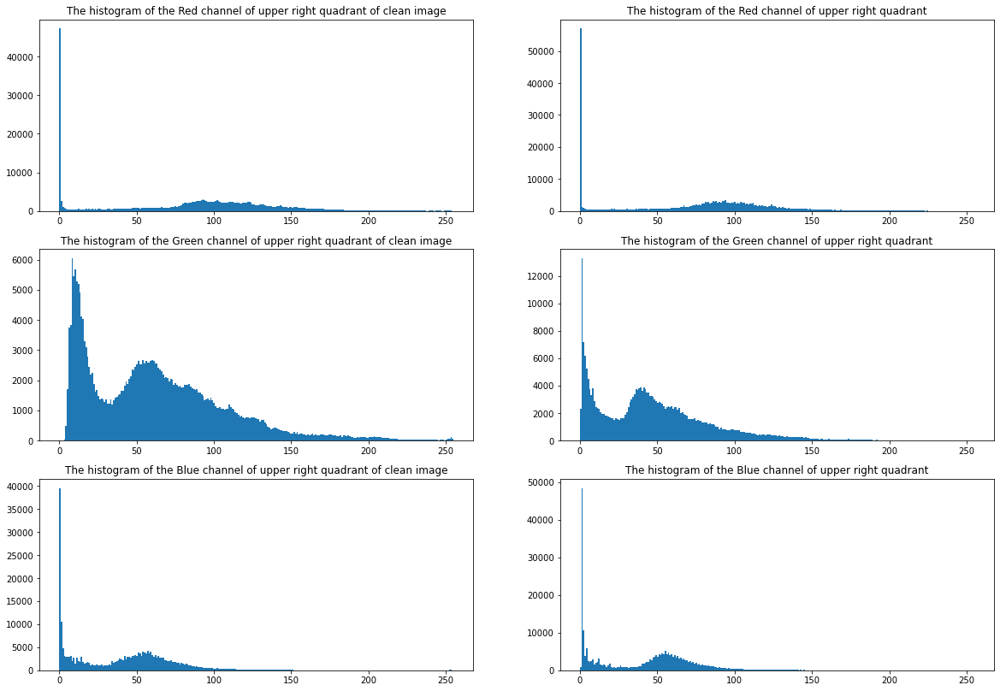

In [29]:
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
Ic_UR_R=Ic_UR[:,:,0]
plt.hist(Ic_UR_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper right quadrant of clean image')
plt.subplot(3,2,2)
plt.hist(I_UR_R_restored.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper right quadrant')
plt.subplot(3,2,3)
Ic_UR_G=Ic_UR[:,:,1]
plt.hist(Ic_UR_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper right quadrant of clean image')
plt.subplot(3,2,4)
plt.hist(I_UR_G_restored.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper right quadrant')
plt.subplot(3,2,5)
Ic_UR_B=Ic_UR[:,:,2]
plt.hist(Ic_UR_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper right quadrant of clean image')
plt.subplot(3,2,6)
plt.hist(I_UR_B_restored.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper right quadrant')

As it is mentioned, all the channels are degraded with reducing intensity resolution and the Uniform noise. At first, the intensities of channels are scaled to [0,255] and then the arithmetic mean filter with size of 3×3 for Red and Blue channels and the size of 5x5 for Green channel are used for restoration. The histogram of the clean image and the restored image in each channels are illustrated.

#### (c-iv) Recompose the Restored Quadrant:

Text(0.5, 1.0, 'The upper right quadrant of original image')

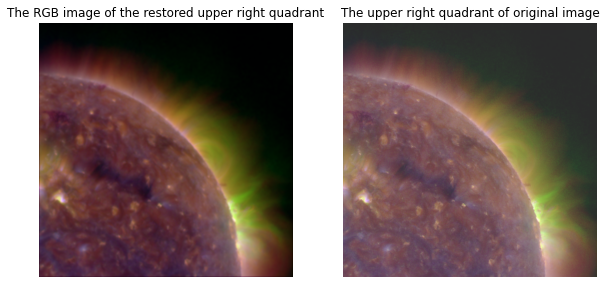

In [30]:
I_UR_R_restored[I_UR_R_restored<0]=0
I_UR_R_restored[I_UR_R_restored>255]=255
I_UR_G_restored[I_UR_G_restored<0]=0
I_UR_G_restored[I_UR_G_restored>255]=255
I_UR_B_restored[I_UR_B_restored<0]=0
I_UR_B_restored[I_UR_B_restored>255]=255
I_UR_restored = np.dstack((I_UR_R_restored,I_UR_G_restored,I_UR_B_restored))
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
I_UR_restored = np.dstack((I_UR_R_restored,I_UR_G_restored,I_UR_B_restored))
I_UR_restored = I_UR_restored/255
plt.imshow(I_UR_restored)
plt.axis('off')
plt.title('The RGB image of the restored upper right quadrant')
plt.subplot(1,2,2)
plt.imshow(I_UR)
plt.axis('off')
plt.title('The upper right quadrant of original image')

Here, the restored upper right quadrant is compared with the original image. Based on their appearance, the original is brighter than the restored image while the restored image is a little blurred.

#### (c-v) Comparison to Reference Image:

MSE of Red channel is: 5934.0312208432615
MSE of Green channel is: 5934.0312208432615
MSE of Blue channel is: 5934.0312208432615
MSE of RGB image is: 6198.450041188185


Text(0.5, 1.0, 'The difference of I_UR and Ic_UR in Blue channel')

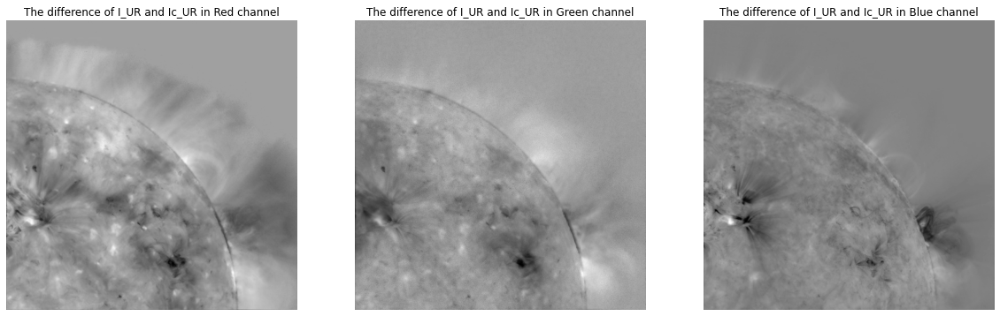

In [31]:
difference_R = np.subtract(I_UR_R_restored, Ic_UR[:,:,0])
difference_G = np.subtract(I_UR_G_restored, Ic_UR[:,:,1])
difference_B = np.subtract(I_UR_B_restored, Ic_UR[:,:,2])
squared_R = np.square(difference_R)
MSE_R = squared.mean()
squared_G = np.square(difference_G)
MSE_G = squared.mean()
squared_B = np.square(difference_B)
MSE_B = squared.mean()
print("MSE of Red channel is:", MSE_R)
print("MSE of Green channel is:", MSE_G)
print("MSE of Blue channel is:", MSE_B)
difference = np.subtract(I_UR_restored, Ic_UR)
squared = np.square(difference)
MSE = squared.mean()
print("MSE of RGB image is:", MSE)
plt.figure(figsize=(20,14))
plt.subplot(1,3,1)
plt.imshow(difference_R, cmap='gray')
plt.title("The difference of I_UR and Ic_UR in Red channel")
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(difference_G, cmap='gray')
plt.title("The difference of I_UR and Ic_UR in Green channel")
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(difference_B, cmap='gray')
plt.axis('off')
plt.title("The difference of I_UR and Ic_UR in Blue channel")

Text(0.5, 1.0, 'The upper right quadrant of clean image')

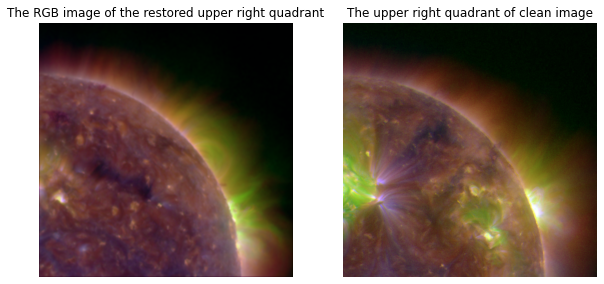

In [32]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
plt.imshow(I_UR_restored)
plt.axis('off')
plt.title('The RGB image of the restored upper right quadrant')
plt.subplot(1,2,2)
plt.imshow(Ic_UR)
plt.axis('off')
plt.title('The upper right quadrant of clean image')

The restored image and the clean image have differences in their appearance and MSE shows the amount of this difference in each channel and totally in RGB image. In the clean image, the sun has some green-ish areas but in the restored image, the sun has not had this kind of region. The color of the emitted light is different in these two images. Because of the noise, the intensity of each pixel in each channel has changed due to noise, thus the color which is appeared in the RGB image differs from the clean image.

## (d) Lower left quadrant:

#### (d-i) R, G, B Channels:

Text(0.5, 1.0, 'The histogram of the Blue channel of lower left quadrant')

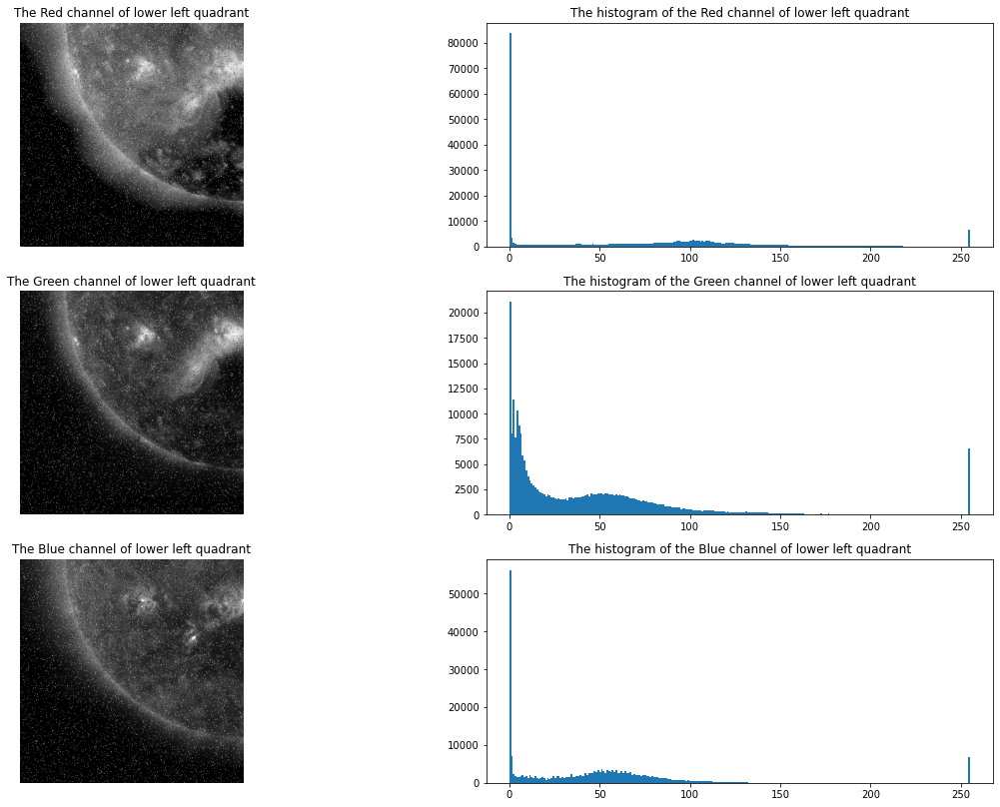

In [33]:
I_LL_R = I_LL[:,:,0]
I_LL_G = I_LL[:,:,1]
I_LL_B = I_LL[:,:,2]
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
plt.imshow(I_LL_R, cmap='gray')
plt.axis('off')
plt.title('The Red channel of lower left quadrant')
plt.subplot(3,2,2)
plt.hist(I_LL_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of lower left quadrant')
plt.subplot(3,2,3)
plt.imshow(I_LL_G, cmap='gray')
plt.axis('off')
plt.title('The Green channel of lower left quadrant')
plt.subplot(3,2,4)
plt.hist(I_LL_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of lower left quadrant')
plt.subplot(3,2,5)
plt.imshow(I_LL_B, cmap='gray')
plt.axis('off')
plt.title('The Blue channel of lower left quadrant')
plt.subplot(3,2,6)
plt.hist(I_LL_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of lower left quadrant')

The image of each channels show that all them are noisy and the type of noise is salt and pepper.

#### (d-ii) Determine Degradation(s) and Relevant Parameters:

Text(0.5, 1.0, 'The histogram of the Blue channel of upper right quadrant')

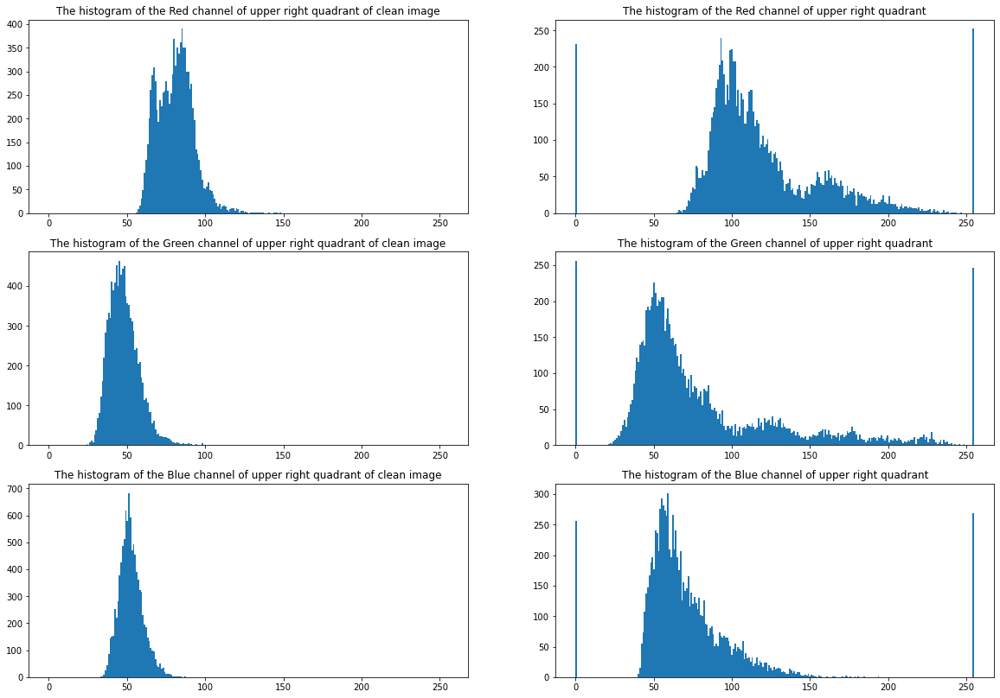

In [34]:
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
Ic_LL_R=Ic_LL[0:100,400:500,0]
plt.hist(Ic_LL_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper right quadrant of clean image')
plt.subplot(3,2,2)
plt.hist(I_LL_R[0:100,400:500].flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of upper right quadrant')
plt.subplot(3,2,3)
Ic_LL_G=Ic_LL[0:100,400:500,1]
plt.hist(Ic_LL_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper right quadrant of clean image')
plt.subplot(3,2,4)
plt.hist(I_LL_G[0:100,400:500].flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of upper right quadrant')
plt.subplot(3,2,5)
Ic_LL_B=Ic_LL[0:100,400:500,2]
plt.hist(Ic_LL_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper right quadrant of clean image')
plt.subplot(3,2,6)
plt.hist(I_LL_B[0:100,400:500].flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of upper right quadrant')

The small region of the image is selected and the histogrm of this part from original image and clean image are compared. This visualization confirm that all three channels are noisy and the noise is salt and pepper because the impulse intensities in 0 and 255. The heights of the peaks corresponding to black and white pixels estimates the probability of salt and pepper (Ps and Pp).

In [35]:
h,_=np.histogram(I_LL_R[0:100,400:500].flatten(),bins=256,range=(0,255))
print('For Red channel the probabilities of salt and pepper noise are Pp=%s and Ps=%s' %(h[0]/10000,h[-1]/10000))

For Red channel the probabilities of salt and pepper noise are Pp=0.0231 and Ps=0.0252


In [36]:
h,_=np.histogram(I_LL_G[0:100,400:500].flatten(),bins=256,range=(0,255))
print('For Green channel the probabilities of salt and pepper noise are Pp=%s and Ps=%s' %(h[0]/10000,h[-1]/10000))

For Green channel the probabilities of salt and pepper noise are Pp=0.0256 and Ps=0.0247


In [37]:
h,_=np.histogram(I_LL_B[0:100,400:500].flatten(),bins=256,range=(0,255))
print('For Blue channel the probabilities of salt and pepper noise are Pp=%s and Ps=%s' %(h[0]/10000,h[-1]/10000))

For Blue channel the probabilities of salt and pepper noise are Pp=0.0256 and Ps=0.0269


#### (d-iii) Restoration of Degraded Channels:

In [38]:
def median_filter(f,nsize):
    nsize2 = int((nsize-1)/2) 
    M,N = f.shape 
    fpad = np.zeros((M+nsize2*2,N+nsize2*2))
    fpad[nsize2:-nsize2,nsize2:-nsize2] = f
    fhat = np.zeros((M,N)) 
    for m in np.arange(0,M): 
        for n in np.arange(0,N): 
            Sxy = fpad[m:m+nsize+1,n:n+nsize+1] 
            fhat[m,n] = np.median(Sxy) 
    return fhat

Text(0.5, 1.0, 'The restored Blue channel of lower left quadrant')

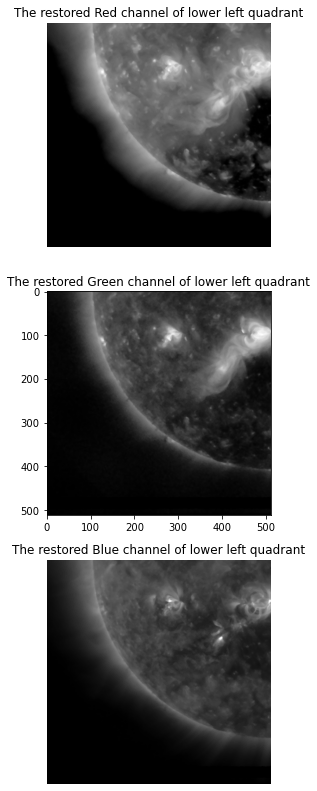

In [39]:
I_LL_R_restored=median_filter(I_LL_R,3)
I_LL_G_restored=median_filter(I_LL_G,3)
I_LL_B_restored=median_filter(I_LL_B,3)

plt.figure(figsize=(20,14))
plt.subplot(3,1,1)
I_LL_R_restored[I_LL_R_restored<0]=0
I_LL_R_restored[I_LL_R_restored>255]=255
plt.imshow(I_LL_R_restored, cmap='gray')
plt.axis('off')
plt.title('The restored Red channel of lower left quadrant')
plt.subplot(3,1,2)
I_LL_G_restored[I_LL_G_restored<0]=0
I_LL_G_restored[I_LL_G_restored>255]=255
plt.imshow(I_LL_G_restored, cmap='gray')
plt.title('The restored Green channel of lower left quadrant')
plt.subplot(3,1,3)
I_LL_B_restored[I_LL_B_restored<0]=0
I_LL_B_restored[I_LL_B_restored>255]=255
plt.imshow(I_LL_B_restored, cmap='gray')
plt.axis('off')
plt.title('The restored Blue channel of lower left quadrant')

As it is mentioned, all channels of this quadrant are corrupted with salt and pepper noise. The best filter for removing this kind of noise is median filter. As the spatial density of this noise in these channels is low, this filter can handle this kind of noise.

#### (d-iv) Recompose the Restored Quadrant:

Text(0.5, 1.0, 'The lower left quadrant of original image')

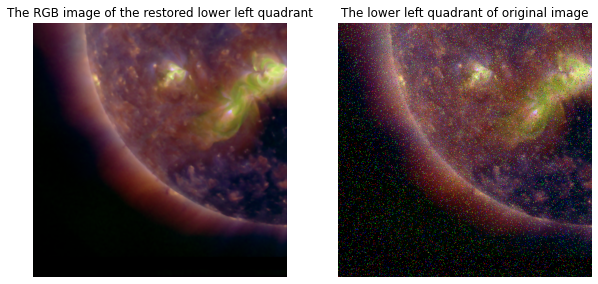

In [40]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
I_LL_restored = np.dstack((I_LL_R_restored,I_LL_G_restored,I_LL_B_restored))
I_LL_restored = I_LL_restored/255
plt.imshow(I_LL_restored)
plt.axis('off')
plt.title('The RGB image of the restored lower left quadrant')
plt.subplot(1,2,2)
plt.imshow(I_LL)
plt.axis('off')
plt.title('The lower left quadrant of original image')

The salt and pepper noise of the original image is removed in the restored image. It seems the image is correctly restored but the image is a little blurred.

#### (d-v) (Graduate Only) Comparison to Reference Image:

MSE of Red channel is: 6198.450041188185
MSE of Green channel is: 6198.450041188185
MSE of Blue channel is: 6198.450041188185
MSE of RGB image is: 3784.5350223633463


Text(0.5, 1.0, 'The difference of I_LL and Ic_LL in Blue channel')

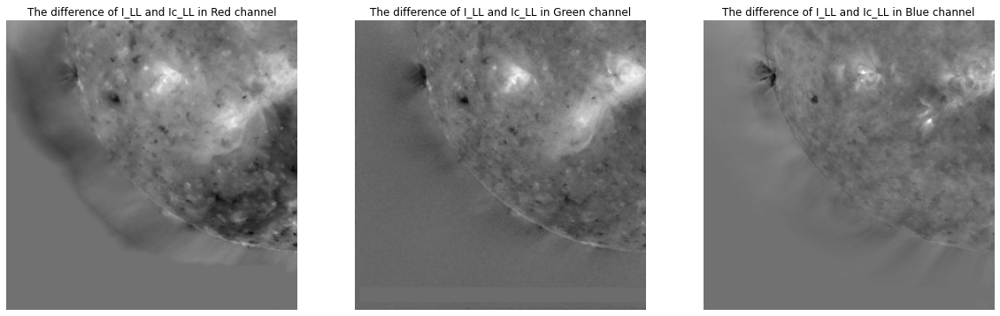

In [41]:
difference_R = np.subtract(I_LL_R_restored, Ic_LL[:,:,0])
difference_G = np.subtract(I_LL_G_restored, Ic_LL[:,:,1])
difference_B = np.subtract(I_LL_B_restored, Ic_LL[:,:,2])
squared_R = np.square(difference_R)
MSE_R = squared.mean()
squared_G = np.square(difference_G)
MSE_G = squared.mean()
squared_B = np.square(difference_B)
MSE_B = squared.mean()
print("MSE of Red channel is:", MSE_R)
print("MSE of Green channel is:", MSE_G)
print("MSE of Blue channel is:", MSE_B)
difference = np.subtract(I_LL_restored, Ic_LL)
squared = np.square(difference)
MSE = squared.mean()
print("MSE of RGB image is:", MSE)
plt.figure(figsize=(20,14))
plt.subplot(1,3,1)
plt.imshow(difference_R, cmap='gray')
plt.title("The difference of I_LL and Ic_LL in Red channel")
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(difference_G, cmap='gray')
plt.title("The difference of I_LL and Ic_LL in Green channel")
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(difference_B, cmap='gray')
plt.axis('off')
plt.title("The difference of I_LL and Ic_LL in Blue channel")

Text(0.5, 1.0, 'The lower left quadrant of clean image')

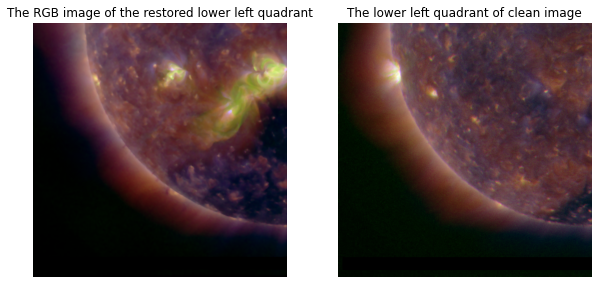

In [42]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
plt.imshow(I_LL_restored)
plt.axis('off')
plt.title('The RGB image of the restored lower left quadrant')
plt.subplot(1,2,2)
plt.imshow(Ic_LL)
plt.axis('off')
plt.title('The lower left quadrant of clean image')

The difference is the variation in the intensity of the three channels because of the noise. It causes appearing the different colors in the restored image. The restored image has some green-ish regions that the clean image has not. The MSEs shows the amount of this difference.

## (e) Lower right quadrant:

#### (e-i) R, G, B Channels:

Text(0.5, 1.0, 'The histogram of the Blue channel of lower right quadrant')

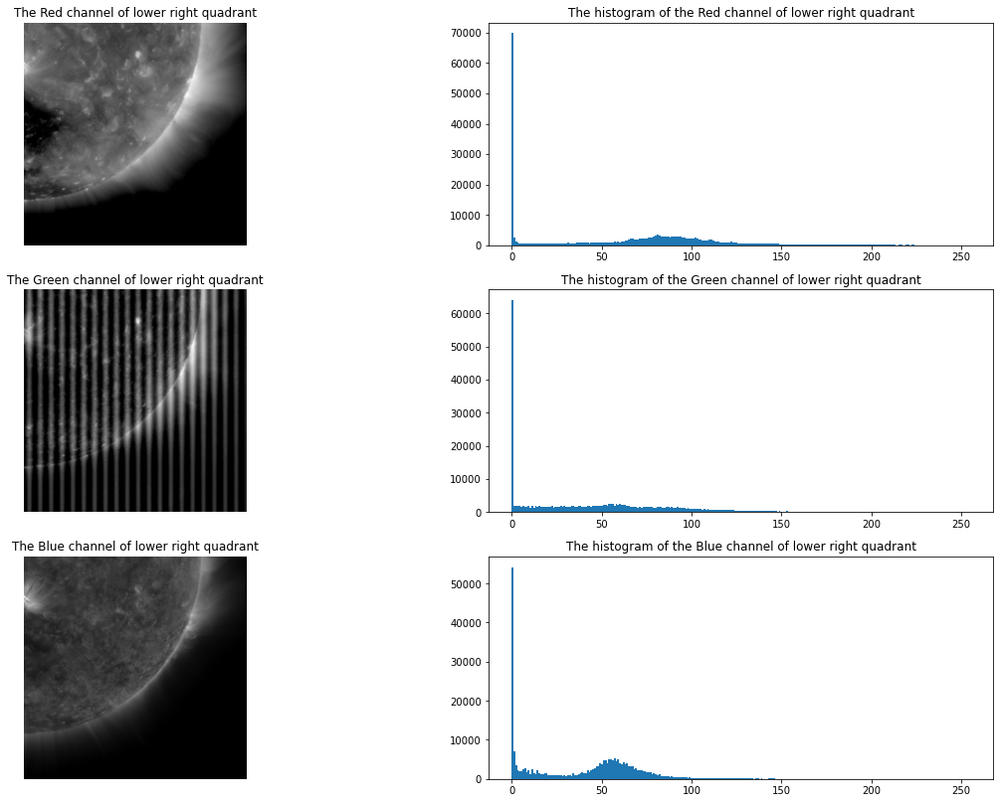

In [43]:
I_LR_R = I_LR[:,:,0].astype(float)
I_LR_G = I_LR[:,:,1].astype(float)
I_LR_B = I_LR[:,:,2].astype(float)
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
plt.imshow(I_LR_R, cmap='gray')
plt.axis('off')
plt.title('The Red channel of lower right quadrant')
plt.subplot(3,2,2)
plt.hist(I_LR_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of lower right quadrant')
plt.subplot(3,2,3)
plt.imshow(I_LR_G, cmap='gray')
plt.axis('off')
plt.title('The Green channel of lower right quadrant')
plt.subplot(3,2,4)
plt.hist(I_LR_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of lower right quadrant')
plt.subplot(3,2,5)
plt.imshow(I_LR_B, cmap='gray')
plt.axis('off')
plt.title('The Blue channel of lower right quadrant')
plt.subplot(3,2,6)
plt.hist(I_LR_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of lower right quadrant')

The illustration of the three channels of the original image is shown that the Green channel has degradation while two other channels has not. For exact analysis, should comparing the histogram of the origianl image with clean imahe. The Green channel is shown that this channel is corrupted with additive sinusoidal noise.

#### (e-ii) Determine Degradation(s) and Relevant Parameters:

Text(0.5, 1.0, 'The histogram of the Blue channel of lower right quadrant')

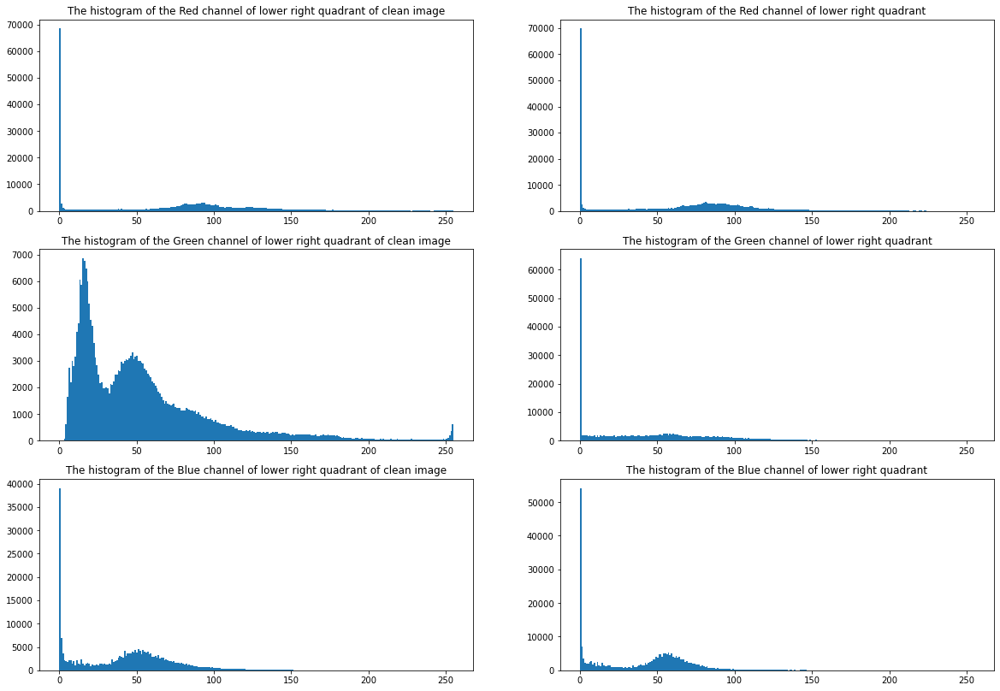

In [44]:
plt.figure(figsize=(20,14))
plt.subplot(3,2,1)
Ic_LR_R=Ic_LR[:,:,0]
plt.hist(Ic_LR_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of lower right quadrant of clean image')
plt.subplot(3,2,2)
plt.hist(I_LR_R.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Red channel of lower right quadrant')
plt.subplot(3,2,3)
Ic_LR_G=Ic_LR[:,:,1]
plt.hist(Ic_LR_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of lower right quadrant of clean image')
plt.subplot(3,2,4)
plt.hist(I_LR_G.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Green channel of lower right quadrant')
plt.subplot(3,2,5)
Ic_LR_B=Ic_LR[:,:,2]
plt.hist(Ic_LR_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of lower right quadrant of clean image')
plt.subplot(3,2,6)
plt.hist(I_LR_B.flatten(),bins=256,range=(0,255))
plt.title('The histogram of the Blue channel of lower right quadrant')

This visualization confirms that the Red and Blue channels have any degradation except the intensity scaling but the Green channels are corrupted with additive sinusoidal noise. The spectrum of this image is shown to better distinguish of the periodic noise. This channel is also degraded wih intensity scaling.

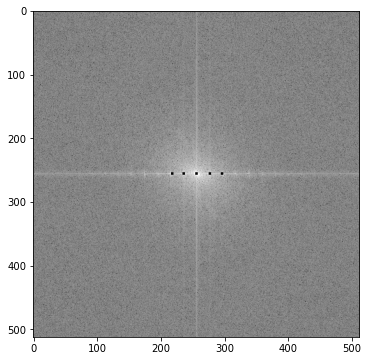

In [45]:
If=np.fft.fft2(I_LR_G)
If=np.fft.fftshift(If)
d=np.log(1+np.abs(If))
d[254:258,254:258]=1
d[254:258,234:238]=1
d[254:258,216:220]=1
d[254:258,275:279]=1
d[254:258,294:298]=1
plt.figure(figsize=(8,6))
plt.imshow(d,cmap='gray')

#### (e-iii) Restoration of Degraded Channels:

Text(0.5, 1.0, 'Notch reject filter')

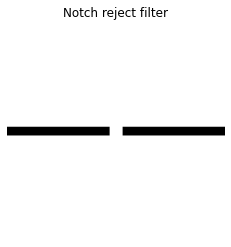

In [46]:
M,N = I_LR_G.shape
H = np.ones((2*M,2*N))
H[M-20:M+20+1,0:N-30] = 0
H[M-20:M+20+1,N+31:2*N+1] = 0
plt.imshow(H,cmap='gray')
plt.axis('off')
plt.title('Notch reject filter')

Text(0.5, 1.0, 'The restored Green channel of lower Right quadrant')

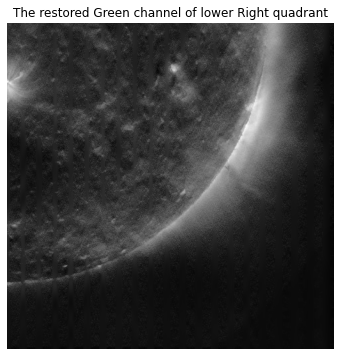

In [48]:
A = I_LR_G
Ap = np.pad(A,((0,A.shape[0]),(0,A.shape[1])),'symmetric')
A_fft = np.fft.fft2(Ap)
A_fft_centered = np.fft.fftshift(A_fft)
B = np.real(np.fft.ifft2(np.fft.fftshift(A_fft_centered*(H))))
I_LR_G_restored = B[0:M,0:N]
I_LR_G_restored=(I_LR_G_restored- np.min(I_LR_G_restored))
I_LR_G_restored =(I_LR_G_restored/np.max(I_LR_G_restored))*255
plt.figure(figsize=(8,6))
plt.imshow(I_LR_G_restored, cmap='gray')
plt.axis('off')
plt.title('The restored Green channel of lower Right quadrant')

In [49]:
I_LR_R_restored =(I_LR_R/np.max(I_LR_R))*255
I_LR_B_restored =(I_LR_B/np.max(I_LR_B))*255

Periodic noise should be analysed and filtered in frequency domain because  periodic noise appears as concentrated bursts of energy in the Fourier transform, at locations corresponding to the frequencies of the periodic interference. In restoration of images corrupted by periodic interference, the best choice is a notch filter. This fiter is removed this noise. All three channels are scaled in the range of [0,255].

#### (e-iv) Recompose the Restored Quadrant:

Text(0.5, 1.0, 'The lower right quadrant of original image')

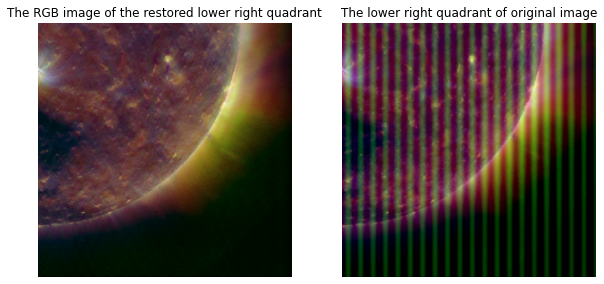

In [50]:
I_LR_R_restored[I_LR_R_restored<0]=0
I_LR_R_restored[I_LR_R_restored>255]=255
I_LR_G_restored[I_LR_B_restored<0]=0
I_LR_G_restored[I_LR_B_restored>255]=255
I_LR_B_restored[I_LR_G_restored<0]=0
I_LR_B_restored[I_LR_G_restored>255]=255
I_LR_restored = np.dstack((I_LR_R_restored ,I_LR_G_restored,I_LR_B_restored))
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)

I_LR_restored=I_LR_restored/255
plt.imshow(I_LR_restored)
plt.axis('off')
plt.title('The RGB image of the restored lower right quadrant')
plt.subplot(1,2,2)
plt.imshow(I_LR)
plt.axis('off')
plt.title('The lower right quadrant of original image')

In the restored image, it seems the effect of the periodic noise has been completely removed. The artifacts which were made by the periodic noise do not exist in the restored image.

#### (e-v) Comparison to Reference Image:

MSE of Red channel is: 3784.5350223633463
MSE of Green channel is: 3784.5350223633463
MSE of Blue channel is: 3784.5350223633463
MSE of RGB image is: 3788.6571649660923


Text(0.5, 1.0, 'The difference of I_LR and Ic_LR in Blue channel')

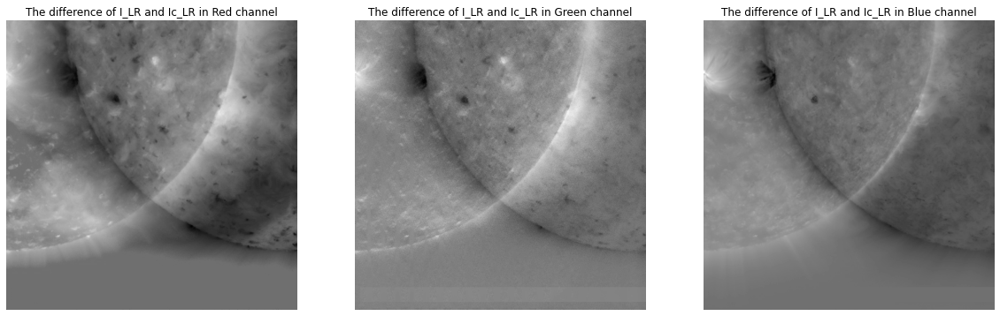

In [51]:
difference_R = np.subtract(I_LR_R_restored, Ic_LL[:,:,0])
difference_G = np.subtract(I_LR_G_restored, Ic_LL[:,:,1])
difference_B = np.subtract(I_LR_B_restored, Ic_LL[:,:,2])
squared_R = np.square(difference_R)
MSE_R = squared.mean()
squared_G = np.square(difference_G)
MSE_G = squared.mean()
squared_B = np.square(difference_B)
MSE_B = squared.mean()
print("MSE of Red channel is:", MSE_R)
print("MSE of Green channel is:", MSE_G)
print("MSE of Blue channel is:", MSE_B)
difference = np.subtract(I_LR_restored, Ic_LL)
squared = np.square(difference)
MSE = squared.mean()
print("MSE of RGB image is:", MSE)
plt.figure(figsize=(20,14))
plt.subplot(1,3,1)
plt.imshow(difference_R, cmap='gray')
plt.title("The difference of I_LR and Ic_LR in Red channel")
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(difference_G, cmap='gray')
plt.title("The difference of I_LR and Ic_LR in Green channel")
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(difference_B, cmap='gray')
plt.axis('off')
plt.title("The difference of I_LR and Ic_LR in Blue channel")

Text(0.5, 1.0, 'The lower right quadrant of clean image')

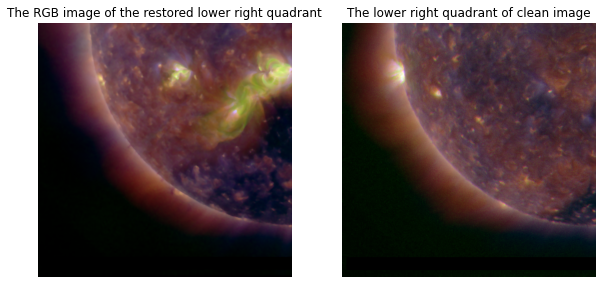

In [52]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
plt.imshow(I_LL_restored)
plt.axis('off')
plt.title('The RGB image of the restored lower right quadrant')
plt.subplot(1,2,2)
plt.imshow(Ic_LL)
plt.axis('off')
plt.title('The lower right quadrant of clean image')

The appearance of these two images is different. The restored image has the green-ish region that the clean image has not. The color and the regions of the sun in these two images are completely different due to the noise and MSEs shows the amount of this difference.

## (f) Restored image:

(-0.5, 1023.5, 1023.5, -0.5)

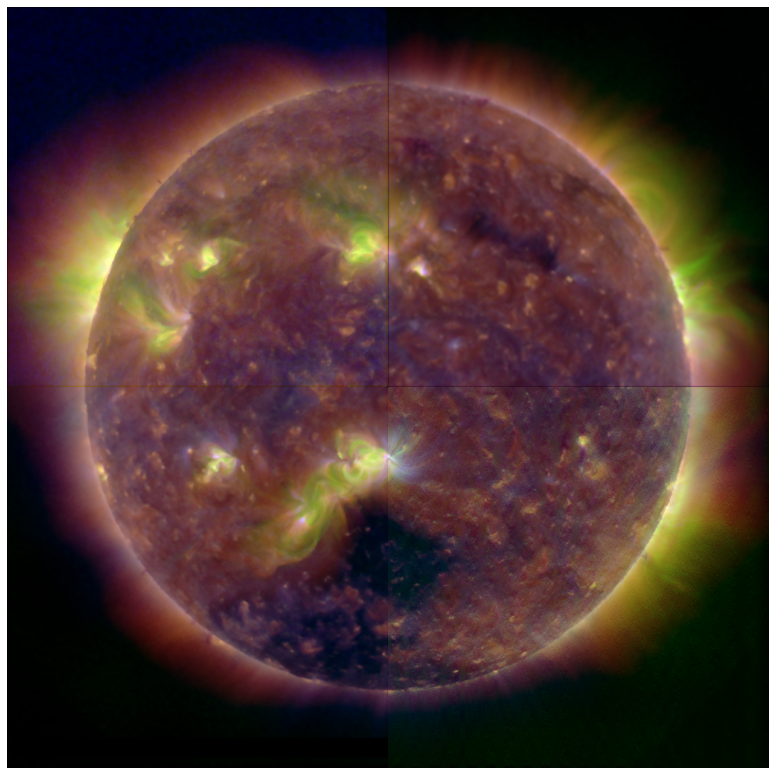

In [53]:
I_restored = np.zeros((1024,1024,3))
I_restored[0:512, 0:512]=I_UL_restored
I_restored[0:512, 512:1024]=I_UR_restored
I_restored[512:1024, 0:512]=I_LL_restored
I_restored[512:1024, 512:1024]=I_LR_restored
plt.figure(figsize=(20,14))
plt.imshow(I_restored)
plt.axis('off')

The main artifacts in this restored image is the dark line around each quadrant. These lind become more visible when all quadrants are concatenated to each other. Here, these quadrant are the restored images with filters. When filtering an image, zero padding can result in a dark band around the edge of the image. In addition, each of this quadrant has restored with different kind of filter so their intensities and appearance cannot be the same especially in their borders. In addition, filters try to eliminate the effect of the noise but it could not restore the image completely. The performance of filters are different and their resulting image deffers from each other.

#### (f-ii) Process Full Restored Image:

In [146]:
def gauss_lowpass(P,Q,sigma):
    u, v = np.meshgrid(range(P),range(Q))
    D = np.sqrt((u-P/2)**2+(v-Q/2)**2)
    H = np.exp(-(D**2)/(2*(sigma**2)))
    return H

In [147]:
I_rgb=I_restored
Red = I_rgb[:,:,0]
Green= I_rgb[:,:,1]
Blue= I_rgb[:,:,2]

In [149]:
I=Red
M=I.shape[0]
N=I.shape[1]
P=2*M
Q=2*N
x_center= round((P-M)/2)
y_center= round((Q-N)/2)
Ip=np.pad(I, ((0,P-M),(0,Q-N)), 'reflect')
x, y = np.meshgrid(range(P),range(Q))
Ip=Ip*((-1)**(x+y))
IP=np.fft.fft2(Ip)


H10=gauss_lowpass(P,Q,120)
G1=np.multiply(IP,H10)
gp=np.fft.ifft2(G1)
gp=(np.real(gp))*((-1)**(x+y))
gr=gp[0:M,0:N]
gr[gr<0]=0
gr[gr>255]=255

In [150]:
I=Green
M=I.shape[0]
N=I.shape[1]
P=2*M
Q=2*N
x_center= round((P-M)/2)
y_center= round((Q-N)/2)
Ip=np.pad(I, ((0,P-M),(0,Q-N)), 'reflect')
x, y = np.meshgrid(range(P),range(Q))
Ip=Ip*((-1)**(x+y))
IP=np.fft.fft2(Ip)


H10=gauss_lowpass(P,Q,120)
G1=np.multiply(IP,H10)
gp=np.fft.ifft2(G1)
gp=(np.real(gp))*((-1)**(x+y))
gg=gp[0:M,0:N]
gr[gg<0]=0
gr[gg>255]=255

In [151]:
I=Blue
M=I.shape[0]
N=I.shape[1]
P=2*M
Q=2*N
x_center= round((P-M)/2)
y_center= round((Q-N)/2)
Ip=np.pad(I, ((0,P-M),(0,Q-N)), 'reflect')
x, y = np.meshgrid(range(P),range(Q))
Ip=Ip*((-1)**(x+y))
IP=np.fft.fft2(Ip)

H10=gauss_lowpass(P,Q,120)
G1=np.multiply(IP,H10)
gp=np.fft.ifft2(G1)
gp=(np.real(gp))*((-1)**(x+y))
gb=gp[0:M,0:N]
gr[gb<0]=0
gr[gb>255]=255

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 1023.5, 1023.5, -0.5)

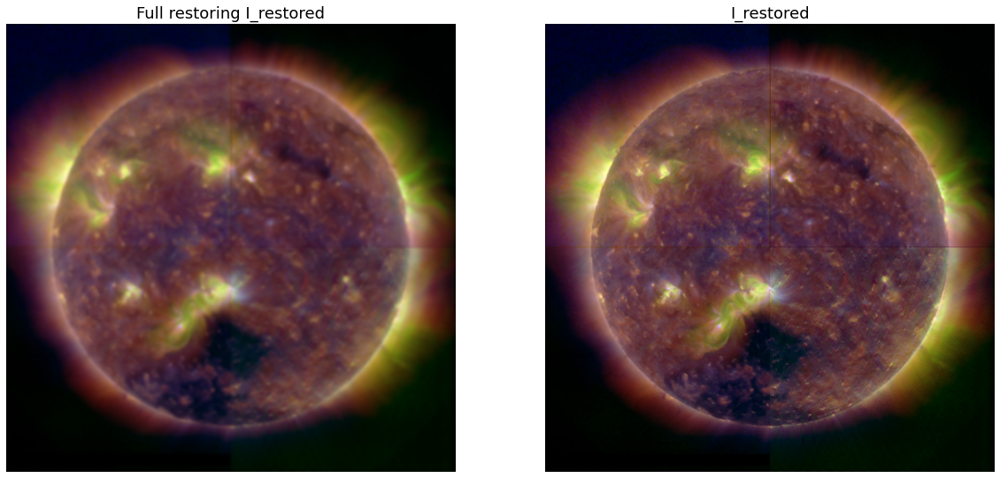

In [158]:
plt.figure(figsize=(20,14))
I_rgb_histeq = np.dstack((gr,gg,gb))
plt.subplot(1,2,1)
plt.imshow(I_rgb_histeq)
plt.title("Full restoring I_restored")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(I_restored)
plt.title("I_restored")
plt.axis('off')

For reducing the artifacts at and around the quadrant boundaries, the image can be processed with gaussian lowpass filter. This filter can blur the image in different level by setting the different cut-0ff frequency or sigma. This parameter should be set in a way that minimizing the artifacts around the quadrant boundries while the minimal blurring of actual solar structure. The sigma=120 provides the better trade off between these two conditions.

## (g) Segmentation:

#### (g-i) Coronal Holes: Coronal

In [133]:
def make_circle_mask(c,im_dims,r):
    import numpy 
    cx = c[0]
    cy = c[1]
    ix = im_dims[0]
    iy = im_dims[1]
    x,y = numpy.meshgrid(numpy.arange(-(cx),(ix-cx),1),numpy.arange(-(cy),(iy-cy),1))
    c_mask = (x**2+y**2)<=r**2
    return c_mask

In [134]:
c =[512,512]
im_dims = [1024,1024]
r = 400
I_masked= make_circle_mask(c,im_dims,r)

(-0.5, 1023.5, 1023.5, -0.5)

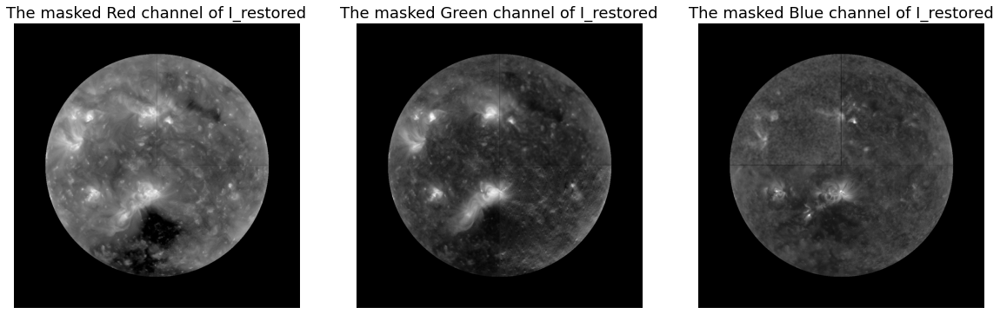

In [168]:
plt.figure(figsize=(20,14))
plt.subplot(1,3,1)
I_masekd_R=I_masked*I_restored[:,:,0]
plt.imshow(I_masekd_R, cmap='gray')
plt.title('The masked Red channel of I_restored')
plt.axis('off')
plt.subplot(1,3,2)
I_masekd_G = I_masked*I_restored[:,:,1]
plt.imshow(I_masekd_G, cmap='gray')
plt.title('The masked Green channel of I_restored')
plt.axis('off')
plt.subplot(1,3,3)
I_masekd_B = I_masked*I_restored[:,:,2]
plt.imshow(I_masekd_B, cmap='gray')
plt.title('The masked Blue channel of I_restored')
plt.axis('off')

#### (g-i) Coronal Holes:

In [170]:
r = I_restored[:,:,0]
g = I_restored[:,:,1]
b = I_restored[:,:,2]

Text(0.5, 1.0, 'Coronal holes regions coded with dark purple')

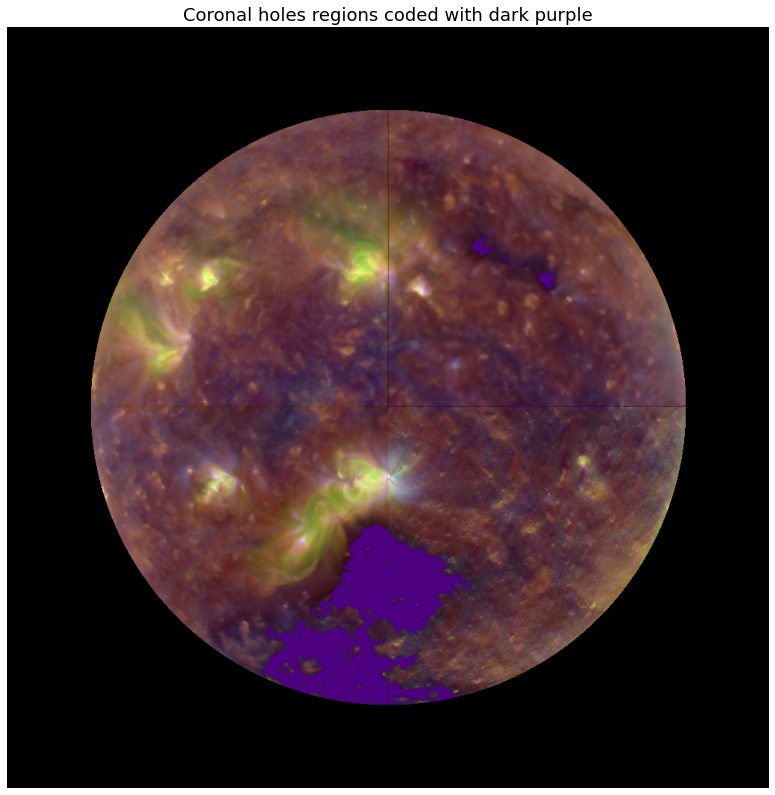

In [175]:
rc = np.where(r<0.18,0.30,r)
gc = np.where(r<0.18,0,g)
bc = np.where(r<0.18,0.50,b)
Ic = np.dstack((rc*I_masked,gc*I_masked,bc*I_masked))
plt.figure(figsize=(20,14))
plt.axis('off')
plt.imshow(Ic)
plt.title("Coronal holes regions coded with dark purple")

Based on the visualization of three channels of the original image, the cornal holes can be better distinguish from red channel. Because the Coranal holes are completely black in this channels and can easily seperate from other regions. Thus, by setting the suitable threshold in red channel, Coronal holes can be determined. As the desired color for this area is dark purple, the intensity of this color in these three channels are [75,0,130]. As the value of channels are float, change these intensities in the range of [0,1] and the thresold is intensities less than 0.18.

#### (g-ii) Active Regions:

(-0.5, 1023.5, 1023.5, -0.5)

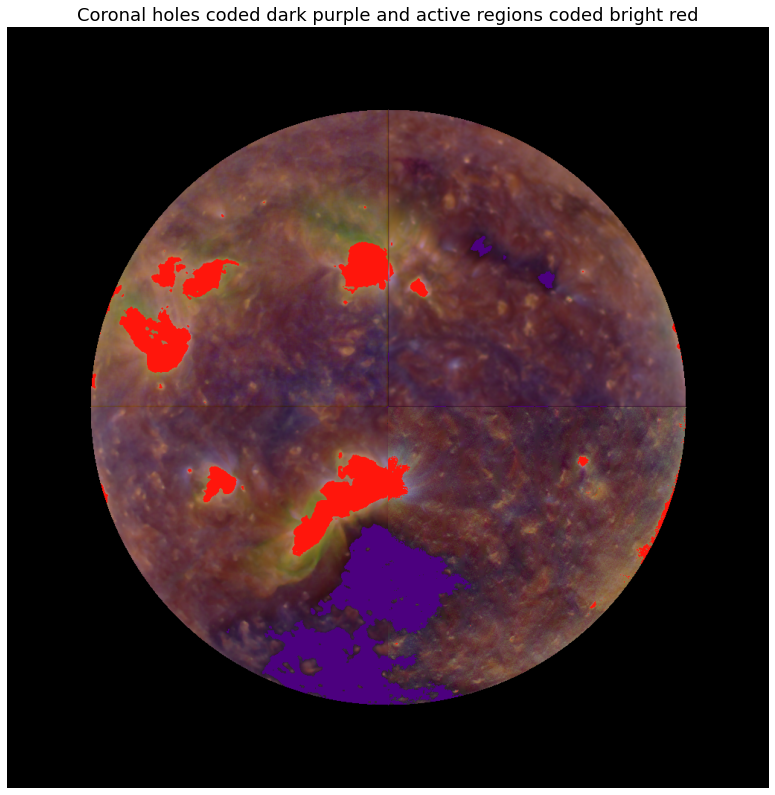

In [176]:
ar = np.where(g>0.5)
rc[ar]=1
gc[ar]=0.09
bc[ar]=0.05
Ia = np.dstack((rc*I_masked,gc*I_masked,bc*I_masked))
plt.figure(figsize=(20,14))
plt.imshow(Ia)
plt.title("Coronal holes coded dark purple and active regions coded bright red")
plt.axis('off')

The active regions are regions that are generally green-ish, yellow-ish, or white-ish, thus it has more intenisty value in green channel. The region can be better distinguished in the green channels by setting the sultable threshold. The intensities more than this threshold are allocated to the active regions. The intensity of this regions should be modified in these channels to have the bright red color.

#### (g-iii) Quiet Sun:

(-0.5, 1023.5, 1023.5, -0.5)

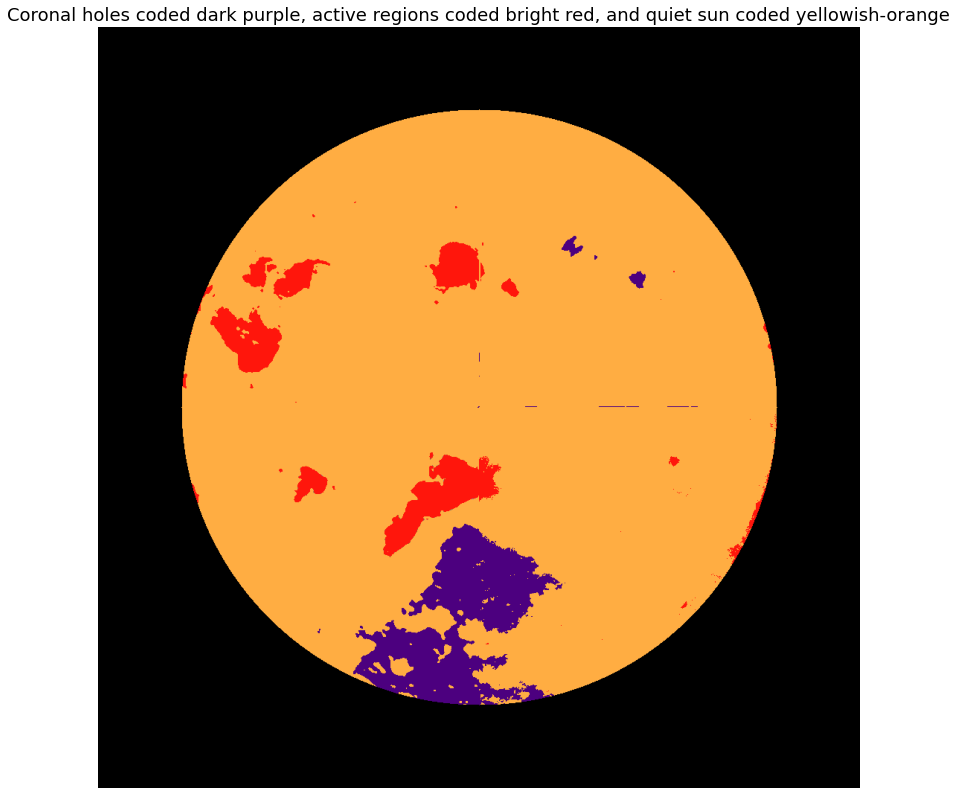

In [177]:
qs = np.where((g<0.5) & (r>0.18))
plt.figure(figsize=(20,14))
rc[qs] = 1
gc[qs] = 0.68
bc[qs] = 0.26
Iq = np.dstack((rc*I_masked,gc*I_masked,bc*I_masked))
plt.imshow(Iq)
plt.title("Coronal holes coded dark purple, active regions coded bright red, and quiet sun coded yellowish-orange")
plt.axis('off')

The quiet sun regions are part of sun that are not allocated to coronal holes and active regions. Thus, the rest of pixels should have yellowish orange color. The pixels that are not allocated to the previous mentioned regions are distinguish and their colors should be modified. 